In [ ]:
! wget "https://datarepo.eng.ucsd.edu/mcauley_group/data/amazon_v2/categoryFilesSmall/Digital_Music_5.json.gz"

--2024-06-10 07:10:45--  https://datarepo.eng.ucsd.edu/mcauley_group/data/amazon_v2/categoryFilesSmall/Digital_Music_5.json.gz
Resolving datarepo.eng.ucsd.edu (datarepo.eng.ucsd.edu)... 132.239.8.30
Connecting to datarepo.eng.ucsd.edu (datarepo.eng.ucsd.edu)|132.239.8.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19408584 (19M) [application/x-gzip]
Saving to: ‘Digital_Music_5.json.gz’

Digital_Music_5.jso 100%[===================>]  18.51M  5.95MB/s    in 3.1s    

2024-06-10 07:10:48 (5.95 MB/s) - ‘Digital_Music_5.json.gz’ saved [19408584/19408584]



In [ ]:
!gunzip "/content/Digital_Music_5.json.gz"

In [ ]:
!pip install pandas

In [ ]:
import pandas as pd
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer
from sklearn.model_selection import train_test_split
import torch
import torch.optim as optim
import numpy as np
from tqdm import tqdm
from imblearn.over_sampling import RandomOverSampler
from collections import Counter
import matplotlib.pyplot as plt
from imblearn.under_sampling import RandomUnderSampler
import random
from sklearn.preprocessing import LabelEncoder

# Part 1

# Load Data

In [ ]:
# Load the dataset from the JSON file
file_path = '/content/Digital_Music_5.json'
data = pd.read_json(file_path, lines=True)

# Extract relevant columns and drop rows with missing values
data = data[['reviewText', 'overall']].dropna()

# Define a custom dataset
class ReviewsDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = int(self.labels[idx]) - 1  # Convert labels to integer and subtract 1

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            return_attention_mask=True,
            return_tensors='pt',
            truncation=True
        )

        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)  # Use long data type for labels
        }

# Initialize tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
max_len = 128

# Prepare data
texts = data['reviewText'].values
labels = data['overall'].values

# Split data into train, validation, and test sets
train_texts, temp_texts, train_labels, temp_labels = train_test_split(
    texts, labels, test_size=0.3, random_state=42)

val_texts, test_texts, val_labels, test_labels = train_test_split(
    temp_texts, temp_labels, test_size=0.5, random_state=42)

# Create datasets
train_dataset = ReviewsDataset(train_texts, train_labels, tokenizer, max_len)
val_dataset = ReviewsDataset(val_texts, val_labels, tokenizer, max_len)
test_dataset = ReviewsDataset(test_texts, test_labels, tokenizer, max_len)

# Create data loaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

# RNN Model

In [ ]:
class RNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(RNNModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.rnn = nn.RNN(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.rnn(embedded, h0)

        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out

In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RNNModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)
# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        predictions = model(batch['input_ids'].long())
        loss = criterion(predictions, batch['label'].long())
        acc = multi_class_accuracy(predictions, batch['label'])
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            predictions = model(batch['input_ids'].long())
            loss = criterion(predictions, batch['label'].long())
            acc = multi_class_accuracy(predictions, batch['label'])
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')


Evaluation: 100%|██████████| 199/199 [00:43<00:00,  4.54it/s]


Epoch: 01
	Train Loss: 0.651 | Train Acc: 79.74%
	 Val. Loss: 0.619 |  Val. Acc: 80.64%


Evaluation: 100%|██████████| 199/199 [00:47<00:00,  4.18it/s]


Epoch: 02
	Train Loss: 0.605 | Train Acc: 80.12%
	 Val. Loss: 0.581 |  Val. Acc: 80.52%


Evaluation: 100%|██████████| 199/199 [00:45<00:00,  4.33it/s]


Epoch: 03
	Train Loss: 0.588 | Train Acc: 80.38%
	 Val. Loss: 0.577 |  Val. Acc: 80.87%


Evaluation: 100%|██████████| 199/199 [00:43<00:00,  4.54it/s]


Epoch: 04
	Train Loss: 0.559 | Train Acc: 80.95%
	 Val. Loss: 0.569 |  Val. Acc: 81.02%


Evaluation: 100%|██████████| 199/199 [00:44<00:00,  4.52it/s]


Epoch: 05
	Train Loss: 0.536 | Train Acc: 81.44%
	 Val. Loss: 0.563 |  Val. Acc: 81.25%


Evaluation: 100%|██████████| 199/199 [00:43<00:00,  4.63it/s]


Epoch: 06
	Train Loss: 0.516 | Train Acc: 81.92%
	 Val. Loss: 0.569 |  Val. Acc: 81.00%


Evaluation: 100%|██████████| 199/199 [00:45<00:00,  4.36it/s]


Epoch: 07
	Train Loss: 0.495 | Train Acc: 82.50%
	 Val. Loss: 0.562 |  Val. Acc: 81.13%


Evaluation: 100%|██████████| 199/199 [00:43<00:00,  4.57it/s]


Epoch: 08
	Train Loss: 0.478 | Train Acc: 83.04%
	 Val. Loss: 0.562 |  Val. Acc: 81.18%


Evaluation: 100%|██████████| 199/199 [00:43<00:00,  4.55it/s]


Epoch: 09
	Train Loss: 0.461 | Train Acc: 83.63%
	 Val. Loss: 0.566 |  Val. Acc: 81.65%


Evaluation: 100%|██████████| 199/199 [00:43<00:00,  4.56it/s]


Epoch: 10
	Train Loss: 0.445 | Train Acc: 84.08%
	 Val. Loss: 0.563 |  Val. Acc: 81.71%


Evaluation: 100%|██████████| 199/199 [00:44<00:00,  4.49it/s]

Test Loss: 0.569 | Test Acc: 81.38%


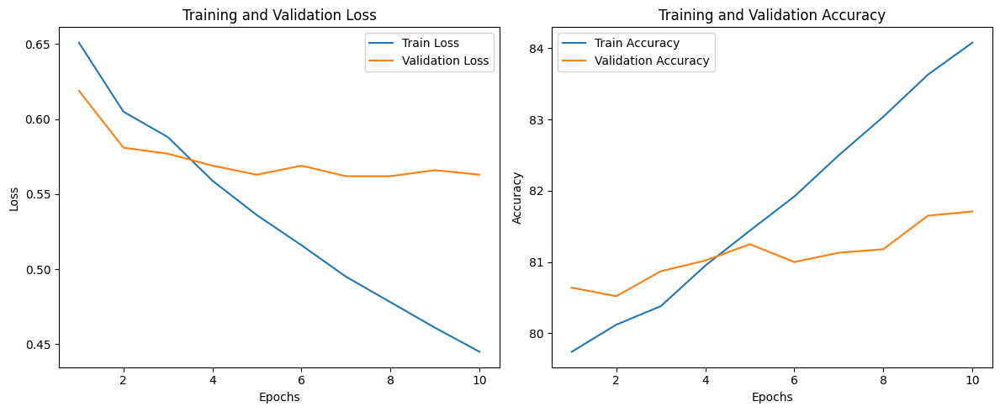

Test Loss: 0.569 | Test Accuracy: 81.38%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [0.651, 0.605, 0.588, 0.559, 0.536, 0.516, 0.495, 0.478, 0.461, 0.445]
val_loss = [0.619, 0.581, 0.577, 0.569, 0.563, 0.569, 0.562, 0.562, 0.566, 0.563]
train_acc = [79.74, 80.12, 80.38, 80.95, 81.44, 81.92, 82.50, 83.04, 83.63, 84.08]
val_acc = [80.64, 80.52, 80.87, 81.02, 81.25, 81.00, 81.13, 81.18, 81.65, 81.71]
test_loss = 0.569
test_acc = 81.38

# Plotting loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 3  # 3 layers

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RNNModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 199/199 [00:24<00:00,  8.01it/s]


Epoch: 01
	Train Loss: 0.654 | Train Acc: 79.83%
	 Val. Loss: 0.625 |  Val. Acc: 80.16%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.66it/s]


Epoch: 02
	Train Loss: 0.613 | Train Acc: 79.94%
	 Val. Loss: 0.602 |  Val. Acc: 80.34%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.59it/s]


Epoch: 03
	Train Loss: 0.590 | Train Acc: 80.25%
	 Val. Loss: 0.575 |  Val. Acc: 80.70%


Evaluation: 100%|██████████| 199/199 [00:24<00:00,  8.26it/s]


Epoch: 04
	Train Loss: 0.573 | Train Acc: 80.52%
	 Val. Loss: 0.570 |  Val. Acc: 80.82%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.80it/s]


Epoch: 05
	Train Loss: 0.558 | Train Acc: 80.82%
	 Val. Loss: 0.561 |  Val. Acc: 80.79%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.89it/s]


Epoch: 06
	Train Loss: 0.538 | Train Acc: 81.24%
	 Val. Loss: 0.556 |  Val. Acc: 81.12%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.92it/s]


Epoch: 07
	Train Loss: 0.519 | Train Acc: 81.64%
	 Val. Loss: 0.542 |  Val. Acc: 81.21%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.77it/s]


Epoch: 08
	Train Loss: 0.513 | Train Acc: 81.77%
	 Val. Loss: 0.553 |  Val. Acc: 81.09%


Evaluation: 100%|██████████| 199/199 [00:27<00:00,  7.26it/s]


Epoch: 09
	Train Loss: 0.505 | Train Acc: 81.96%
	 Val. Loss: 0.552 |  Val. Acc: 81.02%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.79it/s]


Epoch: 10
	Train Loss: 0.494 | Train Acc: 82.30%
	 Val. Loss: 0.550 |  Val. Acc: 81.43%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.75it/s]

Test Loss: 0.555 | Test Acc: 81.03%


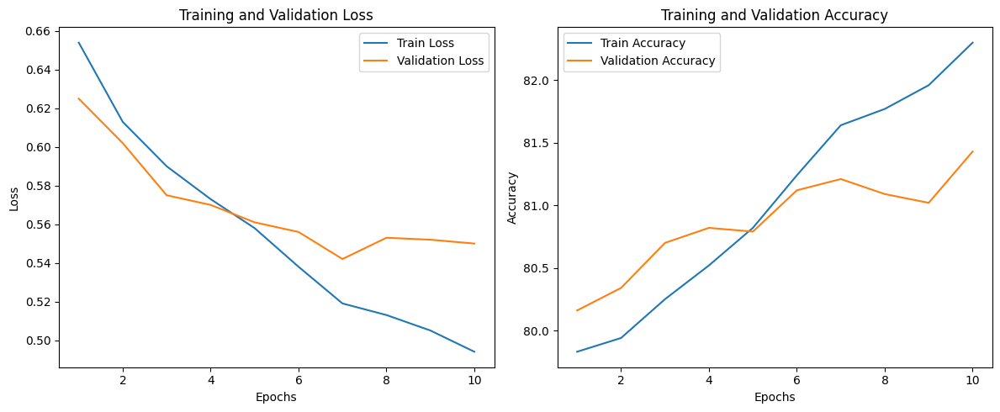

Test Loss: 0.555 | Test Accuracy: 81.03%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [0.654, 0.613, 0.590, 0.573, 0.558, 0.538, 0.519, 0.513, 0.505, 0.494]
val_loss = [0.625, 0.602, 0.575, 0.570, 0.561, 0.556, 0.542, 0.553, 0.552, 0.550]
train_acc = [79.83, 79.94, 80.25, 80.52, 80.82, 81.24, 81.64, 81.77, 81.96, 82.30]
val_acc = [80.16, 80.34, 80.70, 80.82, 80.79, 81.12, 81.21, 81.09, 81.02, 81.43]
test_loss = 0.555
test_acc = 81.03

# Plotting loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 4  # 4 layers

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RNNModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.65it/s]


Epoch: 01
	Train Loss: 0.660 | Train Acc: 79.62%
	 Val. Loss: 0.634 |  Val. Acc: 80.52%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.86it/s]


Epoch: 02
	Train Loss: 0.626 | Train Acc: 79.80%
	 Val. Loss: 0.616 |  Val. Acc: 80.56%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.75it/s]


Epoch: 03
	Train Loss: 0.688 | Train Acc: 79.60%
	 Val. Loss: 0.665 |  Val. Acc: 80.55%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.88it/s]


Epoch: 04
	Train Loss: 0.662 | Train Acc: 79.72%
	 Val. Loss: 0.621 |  Val. Acc: 80.48%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.95it/s]


Epoch: 05
	Train Loss: 0.625 | Train Acc: 79.83%
	 Val. Loss: 0.614 |  Val. Acc: 80.33%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.84it/s]


Epoch: 06
	Train Loss: 0.631 | Train Acc: 79.61%
	 Val. Loss: 0.599 |  Val. Acc: 80.35%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.90it/s]


Epoch: 07
	Train Loss: 0.599 | Train Acc: 80.08%
	 Val. Loss: 0.593 |  Val. Acc: 80.52%


Evaluation: 100%|██████████| 199/199 [00:24<00:00,  8.28it/s]


Epoch: 08
	Train Loss: 0.604 | Train Acc: 80.21%
	 Val. Loss: 0.587 |  Val. Acc: 80.57%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.91it/s]


Epoch: 09
	Train Loss: 0.590 | Train Acc: 80.29%
	 Val. Loss: 0.584 |  Val. Acc: 80.60%


Evaluation: 100%|██████████| 199/199 [00:24<00:00,  8.10it/s]


Epoch: 10
	Train Loss: 0.583 | Train Acc: 80.45%
	 Val. Loss: 0.587 |  Val. Acc: 80.59%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.96it/s]

Test Loss: 0.595 | Test Acc: 80.29%


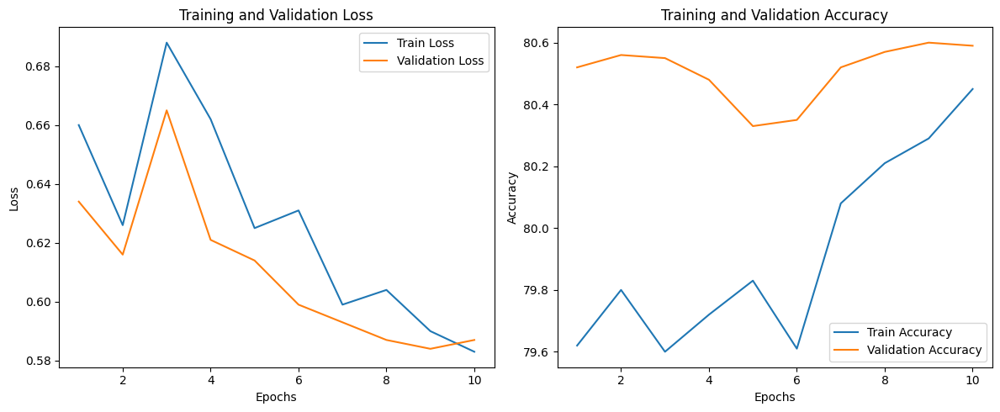

Test Loss: 0.595 | Test Accuracy: 80.29%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [0.660, 0.626, 0.688, 0.662, 0.625, 0.631, 0.599, 0.604, 0.590, 0.583]
val_loss = [0.634, 0.616, 0.665, 0.621, 0.614, 0.599, 0.593, 0.587, 0.584, 0.587]
train_acc = [79.62, 79.80, 79.60, 79.72, 79.83, 79.61, 80.08, 80.21, 80.29, 80.45]
val_acc = [80.52, 80.56, 80.55, 80.48, 80.33, 80.35, 80.52, 80.57, 80.60, 80.59]
test_loss = 0.595
test_acc = 80.29

# Plotting loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


# GRU Model


In [ ]:
class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(GRUModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.gru = nn.GRU(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.gru(embedded, h0)

        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GRUModel(input_dim, hidden_dim, output_dim, n_layers).to(device)


# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)
# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        predictions = model(batch['input_ids'].long())
        loss = criterion(predictions, batch['label'].long())
        acc = multi_class_accuracy(predictions, batch['label'])
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            predictions = model(batch['input_ids'].long())
            loss = criterion(predictions, batch['label'].long())
            acc = multi_class_accuracy(predictions, batch['label'])
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')


Evaluation: 100%|██████████| 199/199 [01:05<00:00,  3.05it/s]


Epoch: 01
	Train Loss: 0.587 | Train Acc: 80.21%
	 Val. Loss: 0.523 |  Val. Acc: 81.71%


Evaluation: 100%|██████████| 199/199 [01:04<00:00,  3.10it/s]


Epoch: 02
	Train Loss: 0.508 | Train Acc: 81.81%
	 Val. Loss: 0.500 |  Val. Acc: 82.52%


Evaluation: 100%|██████████| 199/199 [01:04<00:00,  3.10it/s]


Epoch: 03
	Train Loss: 0.457 | Train Acc: 83.48%
	 Val. Loss: 0.488 |  Val. Acc: 82.85%


Evaluation: 100%|██████████| 199/199 [01:06<00:00,  3.01it/s]


Epoch: 04
	Train Loss: 0.405 | Train Acc: 85.46%
	 Val. Loss: 0.494 |  Val. Acc: 82.85%


Evaluation: 100%|██████████| 199/199 [01:04<00:00,  3.07it/s]


Epoch: 05
	Train Loss: 0.352 | Train Acc: 87.50%
	 Val. Loss: 0.513 |  Val. Acc: 82.96%


Evaluation: 100%|██████████| 199/199 [01:04<00:00,  3.08it/s]


Epoch: 06
	Train Loss: 0.301 | Train Acc: 89.51%
	 Val. Loss: 0.544 |  Val. Acc: 82.60%


Evaluation: 100%|██████████| 199/199 [01:03<00:00,  3.12it/s]


Epoch: 07
	Train Loss: 0.259 | Train Acc: 91.12%
	 Val. Loss: 0.581 |  Val. Acc: 82.63%


Evaluation: 100%|██████████| 199/199 [01:03<00:00,  3.14it/s]


Epoch: 08
	Train Loss: 0.225 | Train Acc: 92.29%
	 Val. Loss: 0.629 |  Val. Acc: 83.17%


Evaluation: 100%|██████████| 199/199 [01:03<00:00,  3.15it/s]


Epoch: 09
	Train Loss: 0.202 | Train Acc: 93.18%
	 Val. Loss: 0.669 |  Val. Acc: 82.98%


Evaluation: 100%|██████████| 199/199 [01:04<00:00,  3.09it/s]


Epoch: 10
	Train Loss: 0.184 | Train Acc: 93.67%
	 Val. Loss: 0.737 |  Val. Acc: 82.90%


Evaluation: 100%|██████████| 199/199 [01:04<00:00,  3.07it/s]

Test Loss: 0.752 | Test Acc: 82.50%


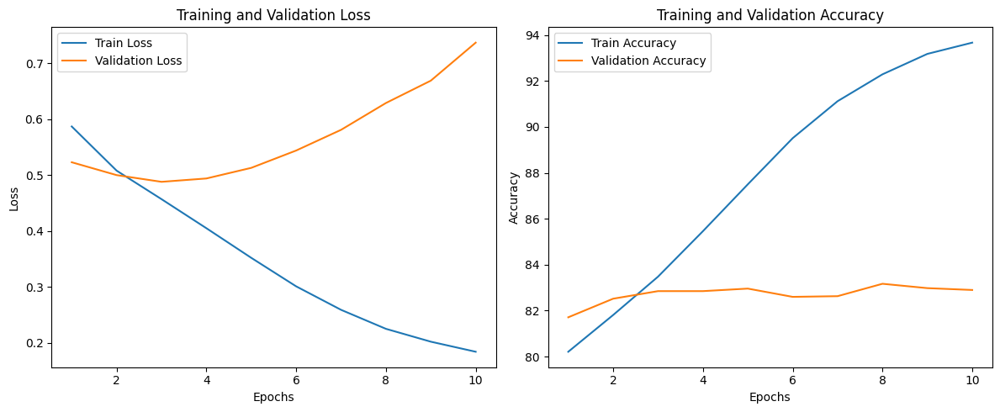

Test Loss: 0.752 | Test Accuracy: 82.5%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [0.587, 0.508, 0.457, 0.405, 0.352, 0.301, 0.259, 0.225, 0.202, 0.184]
val_loss = [0.523, 0.500, 0.488, 0.494, 0.513, 0.544, 0.581, 0.629, 0.669, 0.737]
train_acc = [80.21, 81.81, 83.48, 85.46, 87.50, 89.51, 91.12, 92.29, 93.18, 93.67]
val_acc = [81.71, 82.52, 82.85, 82.85, 82.96, 82.60, 82.63, 83.17, 82.98, 82.90]
test_loss = 0.752
test_acc = 82.50

# Plotting loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 3  # Change this to 3 layers

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GRUModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.67it/s]


Epoch: 01
	Train Loss: 0.591 | Train Acc: 80.17%
	 Val. Loss: 0.532 |  Val. Acc: 81.69%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.57it/s]


Epoch: 02
	Train Loss: 0.514 | Train Acc: 81.76%
	 Val. Loss: 0.502 |  Val. Acc: 82.48%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.58it/s]


Epoch: 03
	Train Loss: 0.463 | Train Acc: 83.37%
	 Val. Loss: 0.488 |  Val. Acc: 83.11%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.42it/s]


Epoch: 04
	Train Loss: 0.412 | Train Acc: 85.23%
	 Val. Loss: 0.496 |  Val. Acc: 82.78%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.45it/s]


Epoch: 05
	Train Loss: 0.359 | Train Acc: 87.35%
	 Val. Loss: 0.519 |  Val. Acc: 83.06%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.54it/s]


Epoch: 06
	Train Loss: 0.310 | Train Acc: 89.20%
	 Val. Loss: 0.548 |  Val. Acc: 83.07%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.67it/s]


Epoch: 07
	Train Loss: 0.268 | Train Acc: 90.74%
	 Val. Loss: 0.599 |  Val. Acc: 83.03%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.56it/s]


Epoch: 08
	Train Loss: 0.236 | Train Acc: 91.97%
	 Val. Loss: 0.625 |  Val. Acc: 82.62%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.61it/s]


Epoch: 09
	Train Loss: 0.215 | Train Acc: 92.62%
	 Val. Loss: 0.697 |  Val. Acc: 82.51%


Evaluation: 100%|██████████| 199/199 [00:25<00:00,  7.68it/s]


Epoch: 10
	Train Loss: 0.195 | Train Acc: 93.35%
	 Val. Loss: 0.722 |  Val. Acc: 83.12%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.58it/s]

Test Loss: 0.727 | Test Acc: 82.69%


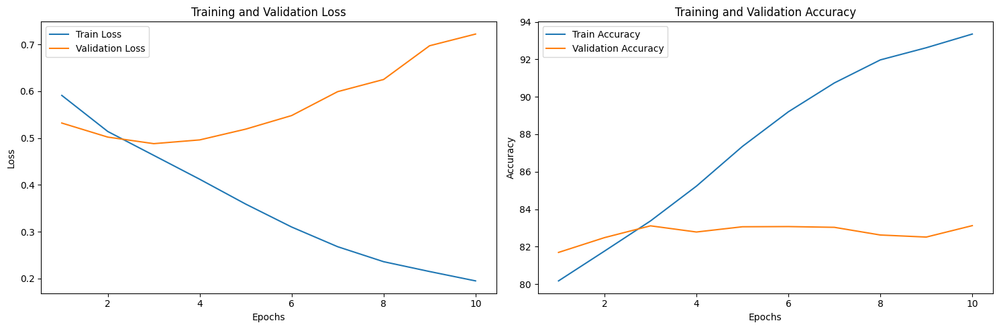

Test Loss: 0.727 | Test Accuracy: 82.69%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [0.591, 0.514, 0.463, 0.412, 0.359, 0.310, 0.268, 0.236, 0.215, 0.195]
val_loss = [0.532, 0.502, 0.488, 0.496, 0.519, 0.548, 0.599, 0.625, 0.697, 0.722]
train_acc = [80.17, 81.76, 83.37, 85.23, 87.35, 89.20, 90.74, 91.97, 92.62, 93.35]
val_acc = [81.69, 82.48, 83.11, 82.78, 83.06, 83.07, 83.03, 82.62, 82.51, 83.12]
test_loss = 0.727
test_acc = 82.69

# Model parameters
learning_rate = [0.01] * 10  # Assuming a constant learning rate for simplicity

# Plotting
plt.figure(figsize=(15, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


# LSTM Model

In [ ]:
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(LSTMModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.lstm(embedded, (h0, c0))

        # Perform average pooling over the sequence dimension
        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = LSTMModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.50it/s]


Epoch: 01
	Train Loss: 0.620 | Train Acc: 79.83%
	 Val. Loss: 0.566 |  Val. Acc: 81.11%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.48it/s]


Epoch: 02
	Train Loss: 0.535 | Train Acc: 81.22%
	 Val. Loss: 0.516 |  Val. Acc: 81.89%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.46it/s]


Epoch: 03
	Train Loss: 0.488 | Train Acc: 82.66%
	 Val. Loss: 0.504 |  Val. Acc: 82.30%


Evaluation: 100%|██████████| 199/199 [00:28<00:00,  6.92it/s]


Epoch: 04
	Train Loss: 0.447 | Train Acc: 84.15%
	 Val. Loss: 0.508 |  Val. Acc: 83.03%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.41it/s]


Epoch: 05
	Train Loss: 0.404 | Train Acc: 85.77%
	 Val. Loss: 0.496 |  Val. Acc: 83.32%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.56it/s]


Epoch: 06
	Train Loss: 0.363 | Train Acc: 87.40%
	 Val. Loss: 0.501 |  Val. Acc: 83.10%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.39it/s]


Epoch: 07
	Train Loss: 0.325 | Train Acc: 88.92%
	 Val. Loss: 0.531 |  Val. Acc: 83.08%


Evaluation: 100%|██████████| 199/199 [00:28<00:00,  7.02it/s]


Epoch: 08
	Train Loss: 0.289 | Train Acc: 90.23%
	 Val. Loss: 0.572 |  Val. Acc: 83.24%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.57it/s]


Epoch: 09
	Train Loss: 0.261 | Train Acc: 91.29%
	 Val. Loss: 0.602 |  Val. Acc: 83.44%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.54it/s]


Epoch: 10
	Train Loss: 0.241 | Train Acc: 91.92%
	 Val. Loss: 0.620 |  Val. Acc: 82.90%


Evaluation: 100%|██████████| 199/199 [00:26<00:00,  7.54it/s]

Test Loss: 0.641 | Test Acc: 82.58%


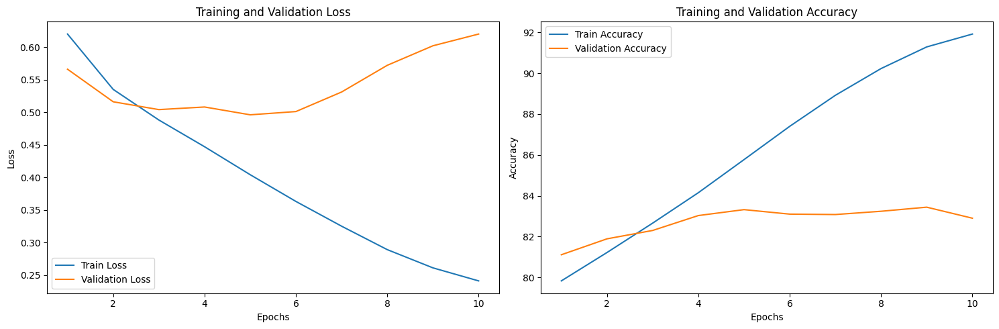

Test Loss: 0.641 | Test Accuracy: 82.58%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [0.620, 0.535, 0.488, 0.447, 0.404, 0.363, 0.325, 0.289, 0.261, 0.241]
val_loss = [0.566, 0.516, 0.504, 0.508, 0.496, 0.501, 0.531, 0.572, 0.602, 0.620]
train_acc = [79.83, 81.22, 82.66, 84.15, 85.77, 87.40, 88.92, 90.23, 91.29, 91.92]
val_acc = [81.11, 81.89, 82.30, 83.03, 83.32, 83.10, 83.08, 83.24, 83.44, 82.90]
test_loss = 0.641
test_acc = 82.58

# Plotting
plt.figure(figsize=(15, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 3

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = LSTMModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 199/199 [00:27<00:00,  7.29it/s]


Epoch: 01
	Train Loss: 0.622 | Train Acc: 79.83%
	 Val. Loss: 0.558 |  Val. Acc: 81.09%


Evaluation: 100%|██████████| 199/199 [00:27<00:00,  7.17it/s]


Epoch: 02
	Train Loss: 0.549 | Train Acc: 80.76%
	 Val. Loss: 0.534 |  Val. Acc: 81.24%


Evaluation: 100%|██████████| 199/199 [00:27<00:00,  7.31it/s]


Epoch: 03
	Train Loss: 0.508 | Train Acc: 81.93%
	 Val. Loss: 0.517 |  Val. Acc: 82.12%


Evaluation: 100%|██████████| 199/199 [00:27<00:00,  7.18it/s]


Epoch: 04
	Train Loss: 0.467 | Train Acc: 83.26%
	 Val. Loss: 0.506 |  Val. Acc: 82.44%


Evaluation: 100%|██████████| 199/199 [00:27<00:00,  7.12it/s]


Epoch: 05
	Train Loss: 0.428 | Train Acc: 84.76%
	 Val. Loss: 0.515 |  Val. Acc: 81.89%


Evaluation: 100%|██████████| 199/199 [00:27<00:00,  7.16it/s]


Epoch: 06
	Train Loss: 0.387 | Train Acc: 86.26%
	 Val. Loss: 0.536 |  Val. Acc: 81.66%


Evaluation: 100%|██████████| 199/199 [00:28<00:00,  7.02it/s]


Epoch: 07
	Train Loss: 0.347 | Train Acc: 87.88%
	 Val. Loss: 0.557 |  Val. Acc: 82.59%


Evaluation: 100%|██████████| 199/199 [00:28<00:00,  7.02it/s]


Epoch: 08
	Train Loss: 0.311 | Train Acc: 89.30%
	 Val. Loss: 0.597 |  Val. Acc: 82.77%


Evaluation: 100%|██████████| 199/199 [00:29<00:00,  6.70it/s]


Epoch: 09
	Train Loss: 0.279 | Train Acc: 90.50%
	 Val. Loss: 0.611 |  Val. Acc: 82.24%


Evaluation: 100%|██████████| 199/199 [00:28<00:00,  7.06it/s]


Epoch: 10
	Train Loss: 0.252 | Train Acc: 91.49%
	 Val. Loss: 0.671 |  Val. Acc: 82.26%


Evaluation: 100%|██████████| 199/199 [00:28<00:00,  6.91it/s]

Test Loss: 0.690 | Test Acc: 82.21%


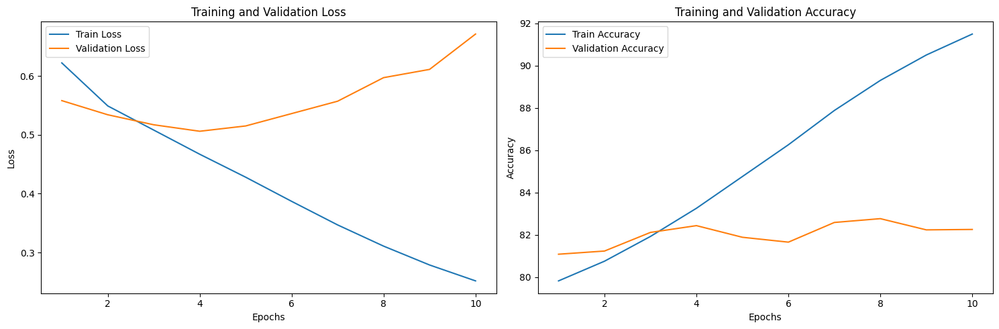

Test Loss: 0.69 | Test Accuracy: 82.21%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [0.622, 0.549, 0.508, 0.467, 0.428, 0.387, 0.347, 0.311, 0.279, 0.252]
val_loss = [0.558, 0.534, 0.517, 0.506, 0.515, 0.536, 0.557, 0.597, 0.611, 0.671]
train_acc = [79.83, 80.76, 81.93, 83.26, 84.76, 86.26, 87.88, 89.30, 90.50, 91.49]
val_acc = [81.09, 81.24, 82.12, 82.44, 81.89, 81.66, 82.59, 82.77, 82.24, 82.26]
test_loss = 0.690
test_acc = 82.21

# Model parameters
learning_rate = [0.01] * 10  # Assuming a constant learning rate for simplicity

# Plotting
plt.figure(figsize=(15, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


# Load Balanced Data

In [ ]:
# Load the dataset from the JSON file
file_path = '/content/Digital_Music_5.json'
data = pd.read_json(file_path, lines=True)

# Extract relevant columns and drop rows with missing values
data = data[['reviewText', 'overall']].dropna()

# Initialize tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
max_len = 128

# Prepare data
texts = data['reviewText'].values
labels = data['overall'].values

# Print count of data of each class before sampling
print("Count of data of each class before sampling:")
print(Counter(labels))

# Calculate the original number of samples in each class
original_counts = Counter(labels)

# Determine the target number of samples for both undersampling and oversampling
target_count = 30000

# Create the undersampling strategy dictionary
undersampling_strategy = {label: min(target_count, count) for label, count in original_counts.items()}

# Increase the count of other classes to 30,000 using undersampling
undersampler = RandomUnderSampler(sampling_strategy=undersampling_strategy, random_state=42)
texts_undersampled, labels_undersampled = undersampler.fit_resample(texts.reshape(-1, 1), labels)

# Convert back to 1D arrays
texts_undersampled = texts_undersampled.flatten()

# Create the oversampling strategy dictionary
oversampling_strategy = {label: target_count for label in original_counts.keys()}

# Use oversampling to balance the entire dataset
oversampler = RandomOverSampler(sampling_strategy=oversampling_strategy, random_state=42)
texts_resampled, labels_resampled = oversampler.fit_resample(texts_undersampled.reshape(-1, 1), labels_undersampled)

# Convert back to 1D arrays
texts_resampled = texts_resampled.flatten()

# Print count of data of each class after sampling
print("\nCount of data of each class after sampling:")
print(Counter(labels_resampled))

# Split data into train, validation, and test sets
train_texts, temp_texts, train_labels, temp_labels = train_test_split(
    texts_resampled, labels_resampled, test_size=0.3, random_state=42)

val_texts, test_texts, val_labels, test_labels = train_test_split(
    temp_texts, temp_labels, test_size=0.5, random_state=42)

# Define a custom dataset
class ReviewsDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = int(self.labels[idx]) - 1  # Convert labels to integer and subtract 1

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            return_attention_mask=True,
            return_tensors='pt',
            truncation=True
        )

        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)  # Use long data type for labels
        }

# Create datasets
train_dataset = ReviewsDataset(train_texts, train_labels, tokenizer, max_len)
val_dataset = ReviewsDataset(val_texts, val_labels, tokenizer, max_len)
test_dataset = ReviewsDataset(test_texts, test_labels, tokenizer, max_len)

# Create data loaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Count of data of each class before sampling:
Counter({5: 135685, 4: 23142, 3: 6792, 1: 2192, 2: 1812})

Count of data of each class after sampling:
Counter({1: 30000, 2: 30000, 3: 30000, 4: 30000, 5: 30000})


# RNN Model

In [ ]:
class RNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(RNNModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.rnn = nn.RNN(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.rnn(embedded, h0)

        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out

In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RNNModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)
# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')


Evaluation: 100%|██████████| 176/176 [00:56<00:00,  3.12it/s]


Epoch: 01
	Train Loss: 1.389 | Train Acc: 38.95%
	 Val. Loss: 1.190 |  Val. Acc: 50.18%


Evaluation: 100%|██████████| 176/176 [00:53<00:00,  3.29it/s]


Epoch: 02
	Train Loss: 1.102 | Train Acc: 55.07%
	 Val. Loss: 1.029 |  Val. Acc: 58.13%


Evaluation: 100%|██████████| 176/176 [00:54<00:00,  3.23it/s]


Epoch: 03
	Train Loss: 0.926 | Train Acc: 62.36%
	 Val. Loss: 0.952 |  Val. Acc: 62.21%


Evaluation: 100%|██████████| 176/176 [00:53<00:00,  3.31it/s]


Epoch: 04
	Train Loss: 1.000 | Train Acc: 58.60%
	 Val. Loss: 0.898 |  Val. Acc: 63.29%


Evaluation: 100%|██████████| 176/176 [00:55<00:00,  3.15it/s]


Epoch: 05
	Train Loss: 0.816 | Train Acc: 66.07%
	 Val. Loss: 0.821 |  Val. Acc: 66.15%


Evaluation: 100%|██████████| 176/176 [00:54<00:00,  3.23it/s]


Epoch: 06
	Train Loss: 0.737 | Train Acc: 69.45%
	 Val. Loss: 0.769 |  Val. Acc: 67.60%


Evaluation: 100%|██████████| 176/176 [00:53<00:00,  3.27it/s]


Epoch: 07
	Train Loss: 0.685 | Train Acc: 71.78%
	 Val. Loss: 0.839 |  Val. Acc: 66.35%


Evaluation: 100%|██████████| 176/176 [00:57<00:00,  3.08it/s]


Epoch: 08
	Train Loss: 0.646 | Train Acc: 73.74%
	 Val. Loss: 0.730 |  Val. Acc: 71.61%


Evaluation: 100%|██████████| 176/176 [00:57<00:00,  3.05it/s]


Epoch: 09
	Train Loss: 0.603 | Train Acc: 75.64%
	 Val. Loss: 0.708 |  Val. Acc: 72.00%


Evaluation: 100%|██████████| 176/176 [00:54<00:00,  3.25it/s]


Epoch: 10
	Train Loss: 0.600 | Train Acc: 75.76%
	 Val. Loss: 0.650 |  Val. Acc: 73.93%


Evaluation: 100%|██████████| 176/176 [00:55<00:00,  3.19it/s]

Test Loss: 0.648 | Test Acc: 74.22%


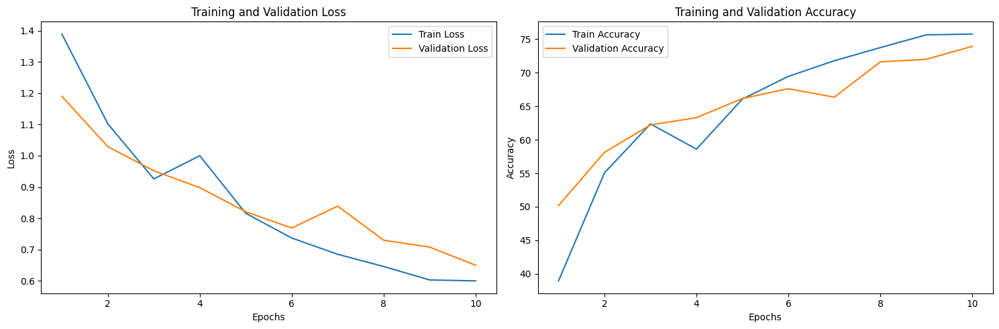

Test Loss: 0.648 | Test Accuracy: 74.22%


In [ ]:
# Data
epochs = range(1, 11)
train_loss = [1.389, 1.102, 0.926, 1.000, 0.816, 0.737, 0.685, 0.646, 0.603, 0.600]
val_loss = [1.190, 1.029, 0.952, 0.898, 0.821, 0.769, 0.839, 0.730, 0.708, 0.650]
train_acc = [38.95, 55.07, 62.36, 58.60, 66.07, 69.45, 71.78, 73.74, 75.64, 75.76]
val_acc = [50.18, 58.13, 62.21, 63.29, 66.15, 67.60, 66.35, 71.61, 72.00, 73.93]
test_loss = 0.648
test_acc = 74.22

# Model parameters
learning_rate = [0.01] * 10  # Assuming a constant learning rate for simplicity

# Plotting
plt.figure(figsize=(15, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 3  # 3 layers

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RNNModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 14

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 176/176 [01:00<00:00,  2.92it/s]


Epoch: 01
	Train Loss: 1.405 | Train Acc: 37.70%
	 Val. Loss: 1.228 |  Val. Acc: 46.22%


Evaluation: 100%|██████████| 176/176 [01:02<00:00,  2.83it/s]


Epoch: 02
	Train Loss: 1.106 | Train Acc: 53.62%
	 Val. Loss: 0.988 |  Val. Acc: 58.95%


Evaluation: 100%|██████████| 176/176 [01:00<00:00,  2.90it/s]


Epoch: 03
	Train Loss: 0.920 | Train Acc: 61.83%
	 Val. Loss: 0.873 |  Val. Acc: 64.15%


Evaluation: 100%|██████████| 176/176 [01:03<00:00,  2.78it/s]


Epoch: 04
	Train Loss: 0.829 | Train Acc: 65.56%
	 Val. Loss: 0.831 |  Val. Acc: 66.36%


Evaluation: 100%|██████████| 176/176 [01:01<00:00,  2.87it/s]


Epoch: 05
	Train Loss: 0.749 | Train Acc: 69.06%
	 Val. Loss: 0.761 |  Val. Acc: 69.72%


Evaluation: 100%|██████████| 176/176 [01:00<00:00,  2.89it/s]


Epoch: 06
	Train Loss: 0.693 | Train Acc: 71.57%
	 Val. Loss: 0.719 |  Val. Acc: 71.86%


Evaluation: 100%|██████████| 176/176 [01:00<00:00,  2.93it/s]


Epoch: 07
	Train Loss: 0.652 | Train Acc: 73.55%
	 Val. Loss: 0.713 |  Val. Acc: 71.81%


Evaluation: 100%|██████████| 176/176 [01:01<00:00,  2.88it/s]


Epoch: 08
	Train Loss: 0.614 | Train Acc: 75.42%
	 Val. Loss: 0.664 |  Val. Acc: 74.20%


Evaluation: 100%|██████████| 176/176 [01:00<00:00,  2.91it/s]


Epoch: 09
	Train Loss: 0.594 | Train Acc: 76.14%
	 Val. Loss: 0.664 |  Val. Acc: 73.76%


Evaluation: 100%|██████████| 176/176 [01:03<00:00,  2.77it/s]


Epoch: 10
	Train Loss: 0.573 | Train Acc: 77.16%
	 Val. Loss: 0.638 |  Val. Acc: 74.75%


Evaluation: 100%|██████████| 176/176 [00:59<00:00,  2.94it/s]


Epoch: 11
	Train Loss: 0.573 | Train Acc: 77.04%
	 Val. Loss: 0.641 |  Val. Acc: 74.75%


Evaluation: 100%|██████████| 176/176 [01:00<00:00,  2.91it/s]


Epoch: 12
	Train Loss: 0.525 | Train Acc: 79.14%
	 Val. Loss: 0.625 |  Val. Acc: 75.54%


Evaluation: 100%|██████████| 176/176 [01:01<00:00,  2.88it/s]


Epoch: 13
	Train Loss: 0.528 | Train Acc: 78.85%
	 Val. Loss: 0.617 |  Val. Acc: 76.41%


Evaluation: 100%|██████████| 176/176 [01:01<00:00,  2.87it/s]


Epoch: 14
	Train Loss: 0.504 | Train Acc: 79.99%
	 Val. Loss: 0.594 |  Val. Acc: 77.08%


Evaluation: 100%|██████████| 176/176 [01:00<00:00,  2.92it/s]

Test Loss: 0.592 | Test Acc: 77.27%


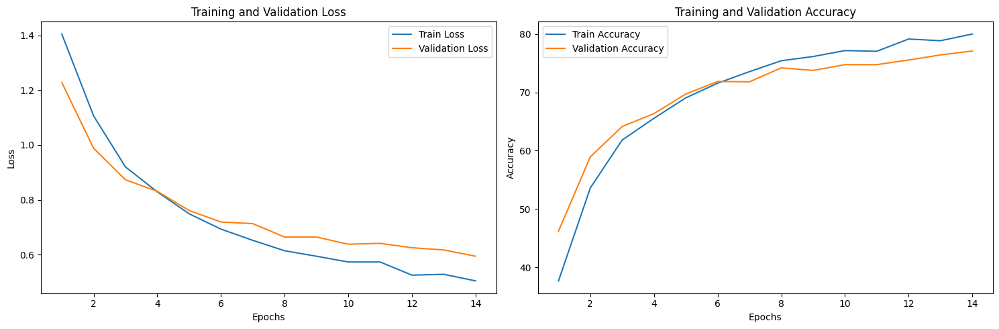

Test Loss: 0.592 | Test Accuracy: 77.27%


In [ ]:
# Data
epochs = range(1, 15)
train_loss = [1.405, 1.106, 0.920, 0.829, 0.749, 0.693, 0.652, 0.614, 0.594, 0.573, 0.573, 0.525, 0.528, 0.504]
val_loss = [1.228, 0.988, 0.873, 0.831, 0.761, 0.719, 0.713, 0.664, 0.664, 0.638, 0.641, 0.625, 0.617, 0.594]
train_acc = [37.70, 53.62, 61.83, 65.56, 69.06, 71.57, 73.55, 75.42, 76.14, 77.16, 77.04, 79.14, 78.85, 79.99]
val_acc = [46.22, 58.95, 64.15, 66.36, 69.72, 71.86, 71.81, 74.20, 73.76, 74.75, 74.75, 75.54, 76.41, 77.08]
test_loss = 0.592
test_acc = 77.27

# Model parameters
learning_rate = [0.01] * 14  # Assuming a constant learning rate for simplicity

# Plotting
plt.figure(figsize=(15, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 4  # 4 layers

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RNNModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 18

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain LosAAs: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 176/176 [00:42<00:00,  4.16it/s]


Epoch: 01
	Train Loss: 1.484 | Train Acc: 32.45%
	 Val. Loss: 1.375 |  Val. Acc: 37.95%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.47it/s]


Epoch: 02
	Train Loss: 1.318 | Train Acc: 40.29%
	 Val. Loss: 1.282 |  Val. Acc: 41.67%


Evaluation: 100%|██████████| 176/176 [00:40<00:00,  4.33it/s]


Epoch: 03
	Train Loss: 1.230 | Train Acc: 43.12%
	 Val. Loss: 1.454 |  Val. Acc: 35.51%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.50it/s]


Epoch: 04
	Train Loss: 1.266 | Train Acc: 42.00%
	 Val. Loss: 1.147 |  Val. Acc: 47.12%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.29it/s]


Epoch: 05
	Train Loss: 1.106 | Train Acc: 50.05%
	 Val. Loss: 1.092 |  Val. Acc: 51.07%


Evaluation: 100%|██████████| 176/176 [00:31<00:00,  5.53it/s]


Epoch: 06
	Train Loss: 1.047 | Train Acc: 54.03%
	 Val. Loss: 0.974 |  Val. Acc: 58.16%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.05it/s]


Epoch: 07
	Train Loss: 0.960 | Train Acc: 59.55%
	 Val. Loss: 0.917 |  Val. Acc: 62.19%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.15it/s]


Epoch: 08
	Train Loss: 0.863 | Train Acc: 63.65%
	 Val. Loss: 0.857 |  Val. Acc: 65.86%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.24it/s]


Epoch: 09
	Train Loss: 0.882 | Train Acc: 62.51%
	 Val. Loss: 0.869 |  Val. Acc: 64.30%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.06it/s]


Epoch: 10
	Train Loss: 0.765 | Train Acc: 68.18%
	 Val. Loss: 0.794 |  Val. Acc: 67.07%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.04it/s]


Epoch: 11
	Train Loss: 0.733 | Train Acc: 69.44%
	 Val. Loss: 0.808 |  Val. Acc: 67.67%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.49it/s]


Epoch: 12
	Train Loss: 0.737 | Train Acc: 69.22%
	 Val. Loss: 0.760 |  Val. Acc: 70.36%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.41it/s]


Epoch: 13
	Train Loss: 0.692 | Train Acc: 71.28%
	 Val. Loss: 0.728 |  Val. Acc: 70.55%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.21it/s]


Epoch: 14
	Train Loss: 0.648 | Train Acc: 73.46%
	 Val. Loss: 0.741 |  Val. Acc: 71.63%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.20it/s]


Epoch: 15
	Train Loss: 0.639 | Train Acc: 74.11%
	 Val. Loss: 0.732 |  Val. Acc: 72.31%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.46it/s]


Epoch: 16
	Train Loss: 0.619 | Train Acc: 74.81%
	 Val. Loss: 0.685 |  Val. Acc: 72.39%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.33it/s]


Epoch: 17
	Train Loss: 0.600 | Train Acc: 75.77%
	 Val. Loss: 0.686 |  Val. Acc: 73.86%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.27it/s]


Epoch: 18
	Train Loss: 0.596 | Train Acc: 75.80%
	 Val. Loss: 0.676 |  Val. Acc: 74.24%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.16it/s]

Test Loss: 0.680 | Test Acc: 74.06%


In [ ]:
# Data
epochs = range(1, 19)
train_loss = [1.484, 1.318, 1.230, 1.266, 1.106, 1.047, 0.960, 0.863, 0.882, 0.765, 0.733, 0.737, 0.692, 0.648, 0.639, 0.619, 0.600, 0.596]
val_loss = [1.375, 1.282, 1.454, 1.147, 1.092, 0.974, 0.917, 0.857, 0.869, 0.794, 0.808, 0.760, 0.728, 0.741, 0.732, 0.685, 0.686, 0.676]
train_acc = [32.45, 40.29, 43.12, 42.00, 50.05, 54.03, 59.55, 63.65, 62.51, 68.18, 69.44, 69.22, 71.28, 73.46, 74.11, 74.81, 75.77, 75.80]
val_acc = [37.95, 41.67, 35.51, 47.12, 51.07, 58.16, 62.19, 65.86, 64.30, 67.07, 67.67, 70.36, 70.55, 71.63, 72.31, 72.39, 73.86, 74.24]
test_loss = 0.680
test_acc = 74.06

# Model parameters
learning_rate = [0.01] * 18  # Assuming a constant learning rate for simplicity

# Plotting
plt.figure(figsize=(15, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Adding learning rate subplot
plt.figure(figsize=(8, 5))
plt.plot(epochs, learning_rate, label='Learning Rate', color='green')
plt.xlabel('Epochs')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedule')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


# GRU Model


In [ ]:
class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(GRUModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.gru = nn.GRU(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.gru(embedded, h0)

        # Perform average pooling over the sequence dimension
        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GRUModel(input_dim, hidden_dim, output_dim, n_layers).to(device)


# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)
# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.13it/s]


Epoch: 01
	Train Loss: 1.062 | Train Acc: 54.95%
	 Val. Loss: 0.738 |  Val. Acc: 69.32%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.19it/s]


Epoch: 02
	Train Loss: 0.627 | Train Acc: 74.01%
	 Val. Loss: 0.570 |  Val. Acc: 76.04%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.17it/s]


Epoch: 03
	Train Loss: 0.497 | Train Acc: 79.27%
	 Val. Loss: 0.504 |  Val. Acc: 78.97%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.40it/s]


Epoch: 04
	Train Loss: 0.425 | Train Acc: 82.35%
	 Val. Loss: 0.494 |  Val. Acc: 79.73%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.44it/s]


Epoch: 05
	Train Loss: 0.373 | Train Acc: 84.50%
	 Val. Loss: 0.460 |  Val. Acc: 81.31%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.21it/s]


Epoch: 06
	Train Loss: 0.328 | Train Acc: 86.45%
	 Val. Loss: 0.479 |  Val. Acc: 81.88%


Evaluation: 100%|██████████| 176/176 [00:35<00:00,  5.00it/s]


Epoch: 07
	Train Loss: 0.296 | Train Acc: 88.07%
	 Val. Loss: 0.449 |  Val. Acc: 83.03%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.25it/s]


Epoch: 08
	Train Loss: 0.267 | Train Acc: 89.20%
	 Val. Loss: 0.471 |  Val. Acc: 83.00%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.29it/s]


Epoch: 09
	Train Loss: 0.248 | Train Acc: 89.97%
	 Val. Loss: 0.481 |  Val. Acc: 83.42%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.45it/s]


Epoch: 10
	Train Loss: 0.228 | Train Acc: 90.77%
	 Val. Loss: 0.481 |  Val. Acc: 84.21%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.17it/s]

Test Loss: 0.483 | Test Acc: 84.06%


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 3  # Change this to 3 layers

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GRUModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 15

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.06it/s]


Epoch: 01
	Train Loss: 1.090 | Train Acc: 53.66%
	 Val. Loss: 0.779 |  Val. Acc: 68.39%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.34it/s]


Epoch: 02
	Train Loss: 0.640 | Train Acc: 73.71%
	 Val. Loss: 0.578 |  Val. Acc: 76.04%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.19it/s]


Epoch: 03
	Train Loss: 0.498 | Train Acc: 79.39%
	 Val. Loss: 0.527 |  Val. Acc: 78.29%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.18it/s]


Epoch: 04
	Train Loss: 0.423 | Train Acc: 82.51%
	 Val. Loss: 0.479 |  Val. Acc: 80.44%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.22it/s]


Epoch: 05
	Train Loss: 0.366 | Train Acc: 84.96%
	 Val. Loss: 0.467 |  Val. Acc: 81.27%


Evaluation: 100%|██████████| 176/176 [00:35<00:00,  4.94it/s]


Epoch: 06
	Train Loss: 0.323 | Train Acc: 86.91%
	 Val. Loss: 0.447 |  Val. Acc: 82.44%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.45it/s]


Epoch: 07
	Train Loss: 0.292 | Train Acc: 88.24%
	 Val. Loss: 0.438 |  Val. Acc: 82.90%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.42it/s]


Epoch: 08
	Train Loss: 0.263 | Train Acc: 89.46%
	 Val. Loss: 0.489 |  Val. Acc: 82.99%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.45it/s]


Epoch: 09
	Train Loss: 0.241 | Train Acc: 90.38%
	 Val. Loss: 0.488 |  Val. Acc: 83.69%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.22it/s]


Epoch: 10
	Train Loss: 0.225 | Train Acc: 90.95%
	 Val. Loss: 0.485 |  Val. Acc: 83.47%


Evaluation: 100%|██████████| 176/176 [00:31<00:00,  5.55it/s]


Epoch: 11
	Train Loss: 0.215 | Train Acc: 91.25%
	 Val. Loss: 0.514 |  Val. Acc: 84.10%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.47it/s]


Epoch: 12
	Train Loss: 0.208 | Train Acc: 91.50%
	 Val. Loss: 0.541 |  Val. Acc: 83.57%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.41it/s]


Epoch: 13
	Train Loss: 0.198 | Train Acc: 91.83%
	 Val. Loss: 0.544 |  Val. Acc: 83.75%


Evaluation: 100%|██████████| 176/176 [00:31<00:00,  5.53it/s]


Epoch: 14
	Train Loss: 0.195 | Train Acc: 91.92%
	 Val. Loss: 0.575 |  Val. Acc: 83.79%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.19it/s]


Epoch: 15
	Train Loss: 0.192 | Train Acc: 92.08%
	 Val. Loss: 0.550 |  Val. Acc: 84.22%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.49it/s]

Test Loss: 0.549 | Test Acc: 84.18%


# LSTM Model

In [ ]:
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(LSTMModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.lstm(embedded, (h0, c0))

        # Perform average pooling over the sequence dimension
        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = LSTMModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.39it/s]


Epoch: 01
	Train Loss: 1.169 | Train Acc: 49.96%
	 Val. Loss: 0.902 |  Val. Acc: 63.32%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.20it/s]


Epoch: 02
	Train Loss: 0.754 | Train Acc: 69.71%
	 Val. Loss: 0.664 |  Val. Acc: 73.34%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.31it/s]


Epoch: 03
	Train Loss: 0.588 | Train Acc: 76.12%
	 Val. Loss: 0.598 |  Val. Acc: 76.11%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.28it/s]


Epoch: 04
	Train Loss: 0.499 | Train Acc: 79.76%
	 Val. Loss: 0.548 |  Val. Acc: 77.90%


Evaluation: 100%|██████████| 176/176 [00:32<00:00,  5.45it/s]


Epoch: 05
	Train Loss: 0.450 | Train Acc: 81.81%
	 Val. Loss: 0.545 |  Val. Acc: 78.63%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.22it/s]


Epoch: 06
	Train Loss: 0.399 | Train Acc: 83.93%
	 Val. Loss: 0.499 |  Val. Acc: 80.30%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.19it/s]


Epoch: 07
	Train Loss: 0.365 | Train Acc: 85.41%
	 Val. Loss: 0.480 |  Val. Acc: 81.60%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.32it/s]


Epoch: 08
	Train Loss: 0.335 | Train Acc: 86.63%
	 Val. Loss: 0.480 |  Val. Acc: 81.99%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.20it/s]


Epoch: 09
	Train Loss: 0.307 | Train Acc: 87.87%
	 Val. Loss: 0.480 |  Val. Acc: 82.38%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.29it/s]


Epoch: 10
	Train Loss: 0.285 | Train Acc: 88.68%
	 Val. Loss: 0.482 |  Val. Acc: 82.47%


Evaluation: 100%|██████████| 176/176 [00:36<00:00,  4.81it/s]

Test Loss: 0.478 | Test Acc: 82.64%


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 3

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = LSTMModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 15

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.18it/s]


Epoch: 01
	Train Loss: 1.212 | Train Acc: 47.53%
	 Val. Loss: 0.989 |  Val. Acc: 59.95%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.26it/s]


Epoch: 02
	Train Loss: 0.792 | Train Acc: 68.01%
	 Val. Loss: 0.688 |  Val. Acc: 72.18%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.09it/s]


Epoch: 03
	Train Loss: 0.609 | Train Acc: 75.15%
	 Val. Loss: 0.589 |  Val. Acc: 76.06%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.09it/s]


Epoch: 04
	Train Loss: 0.512 | Train Acc: 79.05%
	 Val. Loss: 0.540 |  Val. Acc: 77.91%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.12it/s]


Epoch: 05
	Train Loss: 0.450 | Train Acc: 81.54%
	 Val. Loss: 0.518 |  Val. Acc: 78.93%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.13it/s]


Epoch: 06
	Train Loss: 0.397 | Train Acc: 83.83%
	 Val. Loss: 0.539 |  Val. Acc: 79.16%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.12it/s]


Epoch: 07
	Train Loss: 0.367 | Train Acc: 85.20%
	 Val. Loss: 0.456 |  Val. Acc: 81.91%


Evaluation: 100%|██████████| 176/176 [00:35<00:00,  4.91it/s]


Epoch: 08
	Train Loss: 0.332 | Train Acc: 86.57%
	 Val. Loss: 0.500 |  Val. Acc: 81.41%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.28it/s]


Epoch: 09
	Train Loss: 0.308 | Train Acc: 87.51%
	 Val. Loss: 0.482 |  Val. Acc: 82.35%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.30it/s]


Epoch: 10
	Train Loss: 0.289 | Train Acc: 88.42%
	 Val. Loss: 0.489 |  Val. Acc: 82.47%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.12it/s]


Epoch: 11
	Train Loss: 0.267 | Train Acc: 89.27%
	 Val. Loss: 0.516 |  Val. Acc: 82.86%


Evaluation: 100%|██████████| 176/176 [00:36<00:00,  4.87it/s]


Epoch: 12
	Train Loss: 0.256 | Train Acc: 89.58%
	 Val. Loss: 0.508 |  Val. Acc: 83.10%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.13it/s]


Epoch: 13
	Train Loss: 0.239 | Train Acc: 90.33%
	 Val. Loss: 0.506 |  Val. Acc: 83.41%


Evaluation: 100%|██████████| 176/176 [00:33<00:00,  5.18it/s]


Epoch: 14
	Train Loss: 0.228 | Train Acc: 90.66%
	 Val. Loss: 0.556 |  Val. Acc: 83.37%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.17it/s]


Epoch: 15
	Train Loss: 0.221 | Train Acc: 90.98%
	 Val. Loss: 0.543 |  Val. Acc: 83.53%


Evaluation: 100%|██████████| 176/176 [00:34<00:00,  5.10it/s]

Test Loss: 0.535 | Test Acc: 83.67%


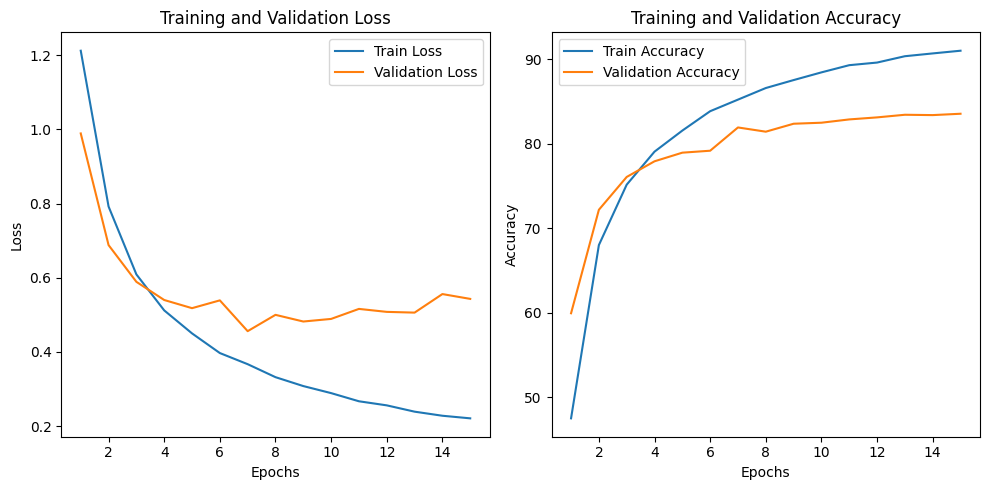

Test Loss: 0.535 | Test Accuracy: 83.67%


# Part 2

# Load Data Amazon

In [ ]:
# Load the dataset from the JSON file
file_path = '/content/Digital_Music_5.json'
data = pd.read_json(file_path, lines=True)

# Extract relevant columns and drop rows with missing values
data = data[['reviewText', 'overall']].dropna()

# Filter out reviews with labels 2 and 4 for use as test data
test_data_2_4 = data[(data['overall'] == 2) | (data['overall'] == 4)]
data = data[(data['overall'] != 2) & (data['overall'] != 4)]

# Initialize tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
max_len = 128

# Prepare data
texts = data['reviewText'].values
labels = data['overall'].values

# Print count of data of each class before sampling
print("Count of data of each class before sampling:")
print(Counter(labels))

# Calculate the original number of samples in each class
original_counts = Counter(labels)

# Determine the target number of samples for both undersampling and oversampling
target_count = 30000

# Create the undersampling strategy dictionary
undersampling_strategy = {label: min(target_count, count) for label, count in original_counts.items()}

# Increase the count of other classes to 30,000 using undersampling
undersampler = RandomUnderSampler(sampling_strategy=undersampling_strategy, random_state=42)
texts_undersampled, labels_undersampled = undersampler.fit_resample(texts.reshape(-1, 1), labels)

# Convert back to 1D arrays
texts_undersampled = texts_undersampled.flatten()

# Create the oversampling strategy dictionary
oversampling_strategy = {label: target_count for label in original_counts.keys()}

# Use oversampling to balance the entire dataset
oversampler = RandomOverSampler(sampling_strategy=oversampling_strategy, random_state=42)
texts_resampled, labels_resampled = oversampler.fit_resample(texts_undersampled.reshape(-1, 1), labels_undersampled)

# Convert back to 1D arrays
texts_resampled = texts_resampled.flatten()

# Print count of data of each class after sampling
print("\nCount of data of each class after sampling:")
print(Counter(labels_resampled))

# Split data into train, validation, and test sets
train_texts, temp_texts, train_labels, temp_labels = train_test_split(
    texts_resampled, labels_resampled, test_size=0.3, random_state=42)

val_texts, test_texts, val_labels, test_labels = train_test_split(
    temp_texts, temp_labels, test_size=0.5, random_state=42)

# Prepare test data for labels 2 and 4
test_texts_2_4 = test_data_2_4['reviewText'].values
test_labels_2_4 = test_data_2_4['overall'].values

# Define a custom dataset
class ReviewsDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = int(self.labels[idx]) - 1  # Convert labels to integer and subtract 1

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            return_attention_mask=True,
            return_tensors='pt',
            truncation=True
        )

        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)  # Use long data type for labels
        }

# Create datasets
train_dataset = ReviewsDataset(train_texts, train_labels, tokenizer, max_len)
val_dataset = ReviewsDataset(val_texts, val_labels, tokenizer, max_len)
test_dataset = ReviewsDataset(test_texts, test_labels, tokenizer, max_len)
test_dataset_2_4 = ReviewsDataset(test_texts_2_4, test_labels_2_4, tokenizer, max_len)

# Create data loaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
test_loader_2_4 = DataLoader(test_dataset_2_4, batch_size=batch_size, shuffle=False)

# Now you have train_loader, val_loader, test_loader, and test_loader_2_4


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Count of data of each class before sampling:
Counter({5: 135685, 3: 6792, 1: 2192})

Count of data of each class after sampling:
Counter({1: 30000, 3: 30000, 5: 30000})


# GRU Model


In [ ]:
class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(GRUModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.gru = nn.GRU(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.gru(embedded, h0)

        # Perform average pooling over the sequence dimension
        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out


In [ ]:
# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GRUModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Accuracy calculation function
def multi_class_accuracy(preds, y):
    _, predicted = torch.max(preds, 1)
    correct = (predicted == y).float()
    acc = correct.sum() / len(correct)
    return acc

# Training and evaluation functions
def train_epoch(model, iterator, optimizer, criterion):
    model.train()
    epoch_loss = 0
    epoch_acc = 0

    for batch in tqdm(iterator, desc="Training"):
        optimizer.zero_grad()
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        loss = criterion(predictions, batch_labels)
        acc = multi_class_accuracy(predictions, batch_labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    with torch.no_grad():
        for batch in tqdm(iterator, desc="Evaluation"):
            batch_input_ids = batch['input_ids'].to(device)
            batch_labels = batch['label'].to(device)
            predictions = model(batch_input_ids)
            loss = criterion(predictions, batch_labels)
            acc = multi_class_accuracy(predictions, batch_labels)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {val_loss:.3f} |  Val. Acc: {val_acc*100:.2f}%')

# Evaluate on test data
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

# # Evaluate on test data with labels 2 and 4
# test_loss_2_4, test_acc_2_4 = evaluate(model, test_loader_2_4, criterion)
# print(f'Test Loss on labels 2 and 4: {test_loss_2_4:.3f} | Test Acc on labels 2 and 4: {test_acc_2_4*100:.2f}%')


Evaluation: 100%|██████████| 106/106 [00:16<00:00,  6.37it/s]


Epoch: 01
	Train Loss: 0.644 | Train Acc: 71.52%
	 Val. Loss: 0.410 |  Val. Acc: 83.95%


Evaluation: 100%|██████████| 106/106 [00:16<00:00,  6.34it/s]


Epoch: 02
	Train Loss: 0.313 | Train Acc: 88.03%
	 Val. Loss: 0.294 |  Val. Acc: 88.69%


Evaluation: 100%|██████████| 106/106 [00:16<00:00,  6.28it/s]


Epoch: 03
	Train Loss: 0.216 | Train Acc: 91.89%
	 Val. Loss: 0.252 |  Val. Acc: 90.74%


Evaluation: 100%|██████████| 106/106 [00:17<00:00,  6.00it/s]


Epoch: 04
	Train Loss: 0.160 | Train Acc: 94.01%
	 Val. Loss: 0.208 |  Val. Acc: 92.53%


Evaluation: 100%|██████████| 106/106 [00:18<00:00,  5.74it/s]


Epoch: 05
	Train Loss: 0.123 | Train Acc: 95.35%
	 Val. Loss: 0.186 |  Val. Acc: 93.55%


Evaluation: 100%|██████████| 106/106 [00:18<00:00,  5.86it/s]


Epoch: 06
	Train Loss: 0.106 | Train Acc: 95.92%
	 Val. Loss: 0.182 |  Val. Acc: 94.08%


Evaluation: 100%|██████████| 106/106 [00:17<00:00,  6.11it/s]


Epoch: 07
	Train Loss: 0.093 | Train Acc: 96.38%
	 Val. Loss: 0.191 |  Val. Acc: 93.82%


Evaluation: 100%|██████████| 106/106 [00:16<00:00,  6.34it/s]


Epoch: 08
	Train Loss: 0.088 | Train Acc: 96.57%
	 Val. Loss: 0.190 |  Val. Acc: 94.12%


Evaluation: 100%|██████████| 106/106 [00:18<00:00,  5.64it/s]


Epoch: 09
	Train Loss: 0.085 | Train Acc: 96.61%
	 Val. Loss: 0.187 |  Val. Acc: 94.11%


Evaluation: 100%|██████████| 106/106 [00:16<00:00,  6.28it/s]


Epoch: 10
	Train Loss: 0.083 | Train Acc: 96.65%
	 Val. Loss: 0.182 |  Val. Acc: 94.36%


Evaluation: 100%|██████████| 106/106 [00:19<00:00,  5.51it/s]

Test Loss: 0.170 | Test Acc: 94.54%


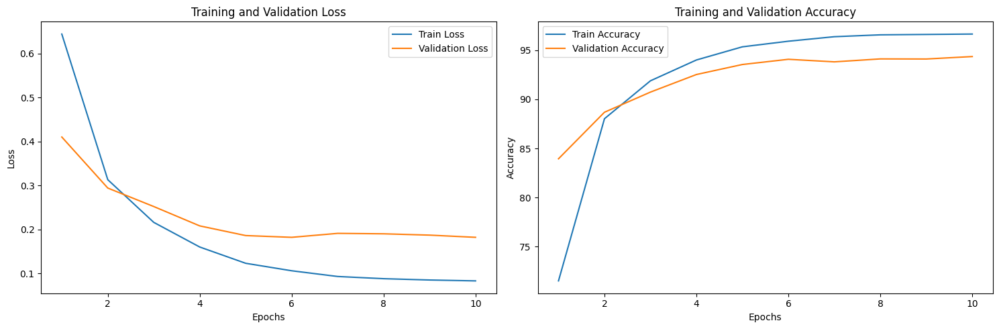

Test Loss: 0.17 | Test Accuracy: 94.54%


In [ ]:
# Data
epochs = range(1, 11)
# Training information
train_loss = [0.644, 0.313, 0.216, 0.160, 0.123, 0.106, 0.093, 0.088, 0.085, 0.083]
train_acc = [71.52, 88.03, 91.89, 94.01, 95.35, 95.92, 96.38, 96.57, 96.61, 96.65]

# Validation information
val_loss = [0.410, 0.294, 0.252, 0.208, 0.186, 0.182, 0.191, 0.190, 0.187, 0.182]
val_acc = [83.95, 88.69, 90.74, 92.53, 93.55, 94.08, 93.82, 94.12, 94.11, 94.36]

# Test information
test_loss = 0.170
test_acc = 94.54

# Plotting
plt.figure(figsize=(15, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Printing test results
print(f"Test Loss: {test_loss} | Test Accuracy: {test_acc}%")


In [ ]:

# Assuming 'model' is your instance of the GRUModel
model_path = 'gru_model.pth'  # Path where you want to save your model

# Save the model and its parameters
torch.save(model.state_dict(), model_path)

print("Model saved successfully.")


NameError: name 'model' is not defined

In [ ]:
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Create an instance of your model
model = GRUModel(input_dim, hidden_dim, output_dim, n_layers)

# Load the saved parameters
model.load_state_dict(torch.load("/content/gru_model.pth"))

# Ensure the model is in evaluation mode if you're doing inference
model.eval()

GRUModel(
  (embedding): Embedding(30522, 128)
  (gru): GRU(128, 128, num_layers=2, batch_first=True)
  (fc): Linear(in_features=128, out_features=5, bias=True)
)

In [ ]:
# Set the device to GPU if available, otherwise use CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming 'model' is already defined
model.to(device)

# Set model to evaluation mode
model.eval()

# List to store input data, true labels, and predicted labels
predictions_2_4 = []

# List to store indices of sentences with true labels 2 or 4
indices_2_4 = []

# Get the indices of sentences with true labels 2 or 4
with torch.no_grad():
    for i, batch in enumerate(test_loader_2_4):
        batch_input_ids = batch['input_ids'].to(device)
        batch_labels = batch['label'].to(device)
        predictions = model(batch_input_ids)
        _, predicted_labels = torch.max(predictions, 1)

        # Loop through the batch
        for j in range(len(batch_labels)):
            true_label = batch_labels[j].item()
            if true_label in [1, 3]:
                indices_2_4.append(i * test_loader_2_4.batch_size + j)

# Randomly select 10 indices from indices_2_4
random_indices = random.sample(indices_2_4, min(len(indices_2_4), 10))

# Print the sentences corresponding to the selected indices
for idx in random_indices:
    batch_idx = idx // test_loader_2_4.batch_size
    sample_idx = idx % test_loader_2_4.batch_size
    batch = next(iter(test_loader_2_4))
    input_data = tokenizer.decode(batch['input_ids'][sample_idx].cpu().numpy(), skip_special_tokens=True)
    true_label = batch['label'][sample_idx].item()

    # Get the predicted label for the current sample
    with torch.no_grad():
        batch_input_ids = batch['input_ids'].to(device)
        predictions = model(batch_input_ids)
        _, predicted_labels = torch.max(predictions, 1)
        predicted_label = predicted_labels[sample_idx].item()

    print(f"Input: {input_data}, True Label: {true_label + 1}, Predicted Label: {predicted_label + 1}")


Input: i've always liked this tune but its really a short run - time reminds me of the movie full metal jacket, this tune is played about midway thru the video., True Label: 4, Predicted Label: 5
Input: ride the lightning is another example of good metal music done by a great metal rock band. the album itself is just like and justice and all dealing with death in certain songs like fade to black, for whom the bell tolls, and creeping death. the album had a deep impact on me on many songs off the album because at the time i bought it i was dealing with thoughts of death and the metallica music infulence my release threw my poems i wrote and really help me get threw a dark period in my life. but the actual music has some amazing metal music within it and deep powerful lyrics in it. so if, True Label: 4, Predicted Label: 5
Input: outside the supernova explosions of the early jackson 5, michael jackson's peak years were'80 -'82 of off the wall and thriller. in fact, thriller and its breakt

# Load Data IMDB

In [ ]:
! wget "https://huggingface.co/datasets/scikit-learn/imdb/resolve/main/IMDB%20Dataset.csv?download=true"

--2024-06-10 07:15:25--  https://huggingface.co/datasets/scikit-learn/imdb/resolve/main/IMDB%20Dataset.csv?download=true
Resolving huggingface.co (huggingface.co)... 18.172.134.24, 18.172.134.124, 18.172.134.88, ...
Connecting to huggingface.co (huggingface.co)|18.172.134.24|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.huggingface.co/repos/77/fa/77fa70b48eef1c98bf08d7b3e43b710623c24c69b4f78d4484f43c3361e9d2af/dfc447764f82be365fa9c2beef4e8df89d3919e3da95f5088004797d79695aa2?response-content-disposition=attachment%3B+filename*%3DUTF-8%27%27IMDB%2520Dataset.csv%3B+filename%3D%22IMDB+Dataset.csv%22%3B&response-content-type=text%2Fcsv&Expires=1718262926&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTcxODI2MjkyNn19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5odWdnaW5nZmFjZS5jby9yZXBvcy83Ny9mYS83N2ZhNzBiNDhlZWYxYzk4YmYwOGQ3YjNlNDNiNzEwNjIzYzI0YzY5YjRmNzhkNDQ4NGY0M2MzMzYxZTlkMmFmL2RmYzQ0Nzc2NGY4MmJlMzY1ZmE5Yz

In [ ]:
!mv '/content/IMDB Dataset.csv?download=true' '/content/IMDB Dataset.csv'

In [ ]:
# URL of the dataset
url = "/content/IMDB Dataset.csv"

# Load the dataset into a DataFrame
df = pd.read_csv(url)

# Display the first few rows of the DataFrame
print(df.head())


                                              review sentiment
0  One of the other reviewers has mentioned that ...  positive
1  A wonderful little production. <br /><br />The...  positive
2  I thought this was a wonderful way to spend ti...  positive
3  Basically there's a family where a little boy ...  negative
4  Petter Mattei's "Love in the Time of Money" is...  positive


In [ ]:
# Load the dataset
url = "/content/IMDB Dataset.csv"
df = pd.read_csv(url)
print(df.head())

# Encode labels
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['sentiment'])

# Tokenizer
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')

class ReviewDataset(Dataset):
    def __init__(self, reviews, labels, tokenizer, max_len):
        self.reviews = reviews
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.reviews)

    def __getitem__(self, idx):
        review = str(self.reviews[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            review,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'review_text': review,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)
        }

max_len = 128
dataset = ReviewDataset(
    reviews=df.review.to_numpy(),
    labels=df.label.to_numpy(),
    tokenizer=tokenizer,
    max_len=max_len
)
dataloader = DataLoader(dataset, batch_size=2)

# Define the model
class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, n_layers):
        super(GRUModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers

        self.embedding = nn.Embedding(input_dim, hidden_dim)
        self.gru = nn.GRU(hidden_dim, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        h0 = torch.zeros(self.n_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.gru(embedded, h0)

        # Perform average pooling over the sequence dimension
        pooled_output = torch.mean(out, dim=1)

        out = self.fc(pooled_output)
        return out

# Model parameters
input_dim = tokenizer.vocab_size
hidden_dim = 128
output_dim = 5  # Number of classes
n_layers = 2

# Instantiate the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GRUModel(input_dim, hidden_dim, output_dim, n_layers).to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Load the pre-trained model weights (if available)
# model.load_state_dict(torch.load('path_to_model_weights.pth'))

model.eval()

# Function to get predictions
def get_predictions(model, dataloader):
    reviews = []
    predictions = []
    prediction_probs = []
    true_labels = []

    with torch.no_grad():
        for d in dataloader:
            texts = d["review_text"]
            input_ids = d["input_ids"].to(device)
            labels = d["label"].to(device)

            outputs = model(input_ids)

            _, preds = torch.max(outputs, dim=1)
            probs = torch.nn.functional.softmax(outputs, dim=1)

            reviews.extend(texts)
            predictions.extend(preds)
            prediction_probs.extend(probs)
            true_labels.extend(labels)

    predictions = torch.stack(predictions).cpu()
    prediction_probs = torch.stack(prediction_probs).cpu()
    true_labels = torch.stack(true_labels).cpu()
    return reviews, predictions, prediction_probs, true_labels

# Get predictions
reviews, predictions, prediction_probs, true_labels = get_predictions(model, dataloader)

# Convert predictions and labels back to text
predicted_labels = label_encoder.inverse_transform(predictions)
true_labels_text = df['sentiment'].iloc[true_labels]

# Display results
for review, pred, true in zip(reviews, predicted_labels, true_labels_text):
    print(f'Review: {review}')
    print(f'True Sentiment: {true}, Predicted Sentiment: {pred}')
    print()


                                              review sentiment
0  One of the other reviewers has mentioned that ...  positive
1  A wonderful little production. <br /><br />The...  positive
2  I thought this was a wonderful way to spend ti...  positive
3  Basically there's a family where a little boy ...  negative
4  Petter Mattei's "Love in the Time of Money" is...  positive
Review: One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review: First off to get my own personal feelings out of the way let me start by saying that I hate so called comedies where every single character is written and played as being so stupid that you wounder if they're all the result of inbreeding.<br /><br />Now I will say this I did see the first three American Pie movies and while they weren't the most amazing movies that I'd ever seen they were all right (and outright masterpieces compared to the three "American Pie Presents" films), I still feel compelled to ask what the hell were they thinking when they made this movie?<br /><br />I also have a few other questions too.<br /><br />Who thought that this was an acceptable use of studio funds and production resources? <br /><br />who approved the final script (and what was that person smoking when they approved it)? <br /><br />And lastly why did anyone think that it deserved to be released into theaters where the average cost of admission is between 10 and 15 dollars depending on wher

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



True Sentiment: positive, Predicted Label: 4

Review: Well, Killshot is not awful, but it comes close. Production values are decent and the main actors do a pretty good job (except for Rosario Dawson in a wasted role), but the story is just pathetic. I don't know if the Elmore Leonard book had such dumb characters,since I haven't read it, but I'm guessing that the book was supposed to be at least slightly humorous. The movie has no detectable humor. After the first twenty minutes, you'll be yelling at the screen, "Oh, come on! Nobody's THAT stupid!!" In a nutshell, and without any spoilers, everybody acts in a manner convenient to the plot, which makes no sense anyway. A very frustrating and unrealistic movie, which may account for it sitting on the shelf for as long as it did.


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review: "COSBY," in my opinion, is a must-see CBS hit! I'm not sure if I've never seen every episode, but I still enjoyed it. It's hard to say which one is my favorite. Also, I really loved the theme song. If you ask me, even though I liked everyone, it would have been nice if Madeline Kahn hadn't passed away during the show's run. Since that happened, I've always wondered what the show would have been like. Everyone always gave a good performance, the production design was spectacular, the costumes were well-designed, and the writing was always very strong. In conclusion, even though it can be seen on TBS now, I strongly recommend you catch it just in case it goes off the air for good
True Sentiment: positive, Predicted Label: 2

Review: Indian Directors have it tough, They have to compete with movies like "Laggan" where 11 henpecked,Castrated males defend their village and half of them are certifiable idiots. "Devdas", a hapless, fedar- festooned foreign return drinking to oblivion, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




True Sentiment: negative, Predicted Label: 2

Review: Feh. This movie started out in an interesting manner, but quickly ran the gamut from confusing to dull. The confusing parts happened mostly at the beginning, where the cut scenes are so numerous that its hard to tell just what is going on for the first twenty minutes or so. The dull comes later, with a tepid romance between the two living people(pusses both). The vengeful spirit of the dead girl is actually the most lively person in the film, which is sad. If the rest of the cast had been up to her caliber, the movie might have been better.<br /><br />Maybe. Because the storyline gets really interesting for awhile, as it appears that the insane priestess mother of the dead sixteen year old girl is trying to resurrect her daughter from the dead, with the decidedly unfortunate side effect that all of the other dead people would come back as well, take on solid human form, and most likely start killing off everybody. A sort of Japanes

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



True Sentiment: negative, Predicted Label: 4

Review: This is a wonderful movie about a brothel in a fishing village, that could be best described with scene constellations and direction of old Kurosawa's works, combined with Dostoyevski's topics of human psychology (O-shin - Sonia Marmeladova ), Shakespeare's drama and Hans Christian Andersen's tragic and cheerfulness. The screenplay is wondrous, the scenes are colour- and beautiful some scenes stay really imprinted in my mind. The plot is interesting and unpredictable - each of the characters is very well developed and interesting - there is also a little action, so if you don't like all the sentiments you'd also come to your costs - . It is not about mysterious Geishas and proud Samurai with their Bushido pouring all out of them, but about life, work and kinds of people found everywhere at any time. A lovely and fascinating tribute to Kurosawa, certainly worth seeing.
True Sentiment: positive, Predicted Label: 2

Review: Just read t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



True Sentiment: negative, Predicted Label: 4

Review: A truly dreadful film. I did not know initially that this was a Kiwi effort - but very soon I started to realize that all the characters were speaking with hardly disguised kiwi accents under the fake American ones. Why did it need to be set n America anyway? - it could have been set in NZ and then the actors could have used their normal voices. Surely someone in the production team could hear the dreadful attempts at speaking with American accents? A bad bad film. I am surprised it has lasted this long - how did it make it out of the can? It just seemed like a very poor attempt at a Segal/Willis type action man flick.A TOTAL WASTE OF MONEY! If there was any TAXPAYER money in this piece of trash, I would be leading a revolution to have all the money put back into the Treasury. I am still reeling (get it? pun, reeling!) at the absolute garbage I have just seen. Why did I continue to watch? Well, I am a movie fanatic and cant help ,my

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





Review: This movie is very funny. Amitabh Bachan and Govinda are absolutely hilarious. Acting is good. Comedy is great. They are up to their usual thing. It would be good to see a sequel to this :)<br /><br />Watch it. Good time-pass movie
True Sentiment: positive, Predicted Label: 4

Review: I wasn't expecting much because of the harsh reviews, and proceeded to enjoy the movie a great deal as a result. Softer colors and less stunning compositions of the shots than some of his previous films, in my opinion, allowed the narrative to take the focus. Though the religious conflict in a vampire flick was commonplace, I felt like many of the other things were not. For example:<br /><br />how his powers were often revealed through interaction with her.<br /><br />the very strong and well acted love scenes.<br /><br />the symbolism of the man they killed to get closer to each other actually separating them even more.<br /><br />Their strong differences of what it means to be 'vampire' create

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review: I can enjoy a guilty pleasure vigilante flick, but this is just bad. And not bad in a way you might enjoy seeing MST3K make fun of it. It's just nauseatingly bad like you can't find anything to enjoy about this no matter how hard you try. I truly regret wasting 2 hours of precious life on this crap. You can tell by watching it that no one was asked to act and everyone in it knew this film would only bury their careers. Apparently "Walking Tall" has garnered enough income that someone decided they could make a buck off their investment. If it's not the worst film I've seen, it's so bad that it's blotted the worse films from my memory.
True Sentiment: negative, Predicted Label: 2

Review: I was really, really disappointed with this movie. it started really well, and built up some great atmosphere and suspense, but when it finally got round to revealing the "monster"...it turned out to be just some psycho with skin problems......again. Whoop-de-do. Yet another nutjob movie...like 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




True Sentiment: positive, Predicted Label: 2

Review: Russian actress TATIANA SAMOILOVA reminds me so much of the young Audrey Hepburn and the camera in THE CRANES ARE FLYING seems to love her just as much. She is the focal point of a bittersweet war romance against the background of World War II in Moscow.<br /><br />The film is almost poetic in its gorgeous B&W cinematography which was the main reason for watching the film in the first place, since I had never heard of it and decided to give it a try when it aired on TCM.<br /><br />It's a very moving love story about a girl's deep love for a man who is suddenly swept away by his role as a soldier drafted in wartime Russia. She's unable to forget the memory of her romantic attachment to him, but inexplicably marries someone else who has forced himself on her, a pianist who soon realizes that she still loves the soldier she hopes to hear from. Their marriage is a troubled one because she can't let go of her remembrance of a happier t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review: When I started watching "Fay Grim", I had no idea that it was a sequel to "Henry Fool". Now, the latter was not a movie that I envisioned as having a sequel. But one has arrived, and it's quite good. I assume that you've seen the original, so I won't explain it. This one starts with Fay (Parker Posey) living with her son whom she had with deadbeat Henry (Thomas Jay Ryan). Simon (James Urbaniak) is still in jail. One day, the son gets expelled for bringing a pornographic toy to school. But this is no ordinary toy. It holds a secret that explains much of what happened in the first movie. And this secret delves deeper into geopolitics than "Syriana".<br /><br />I must say that I'm quite impressed with what Hal Hartley has accomplished here. Maybe this one doesn't quite reach the original's quality, but it certainly takes a good look at what's going on in the world. And the end leaves open the possibility for another sequel.<br /><br />Also starring Jeff Goldblum.
True Sentiment: p

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
True Sentiment: positive, Predicted Label: 2

Review: This short is a puzzlement. Words fail me here, as this is almost indescribable, Technically exceptional after more than 90 years (the visuals are remarkable and even occasionally amazing), this is not something you watch if you like things that are mundane or "normal'-because it most certainly is not either. This be an odd one, gang. Well worth checking out, but if things like Ren and Stimpy make your head hurt, you may want to skip this. Recommended.
True Sentiment: positive, Predicted Label: 4

Review: My mom and I went to the Ft Worth Premiere mainly to see George Strait, but ended up getting the chance to see the movie premier at Bass Hall. What a wonderful, beautiful film which not only depicts the beautiful Texas landscape, but also had a great feel-good storyline. It was well written, directed and produced and my mom and I loved it from start to finish!. Thank you Jay for gi